In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import json

In [2]:
def imshow(image):
    print(f'Shape = {image.shape}, max value = {np.max(image)}, min value = {np.min(image)}')
    image = np.reshape(image, (image.shape[0], image.shape[1], -1))
    plt.figure(figsize=(16, 8))
    if image.shape[2] == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.imshow(image, vmin=0)
    else:
        plt.imshow(image, cmap='gray', vmin=0)
    plt.show()
    
def constraint_range_01(image):
    image = (image - np.min(image))/(np.max(image) - np.min(image))
    return image

def constraint_mean_0(image):
    image = (image - np.min(image))/255.0
    return image

In [3]:
def add_rain(image_name, rain_level, rain_pattern, sample=True, alpha=0.01, beta=0.005, a=0.01):
    image_path = 'data/Cityscapes/leftImg8bit_trainvaltest/leftImg8bit/train/' + image_name + '_000019_leftImg8bit.png'
    output_sample_path = 'data/RainCityscapes/leftImg8bit_trainval_rain/leftImg8bit_rain/train/' + image_name + '_000019_leftImg8bit_rain_alpha_0.01_beta_0.005_dropsize_0.01_pattern_6.png'
    camera_calibration_path = 'data/Cityscapes/camera_trainvaltest/camera/train/' + image_name + '_000019_camera.json'
    disparity_path = 'data/Cityscapes/disparity_trainvaltest/disparity/train/' + image_name + '_000019_disparity.png'
    depth_inverted_rain_path = 'data/RainCityscapes/leftImg8bit_trainval_rain/depth_rain/train/' + image_name + '_000019_depth_rain.png'
    rain_pattern_path = 'rain-rendering/data/output/cityscapes/leftImg8bit/train/cologne/rain/' + rain_level + '/rain_mask/' + rain_pattern + '_000019_leftImg8bit.png'

    camera_calibration_file = open(camera_calibration_path)
    camera_calibration = json.load(camera_calibration_file)
    camera_calibration_file.close()

    baseline = camera_calibration['extrinsic']['baseline']
    fxy = (camera_calibration['intrinsic']['fx'] + camera_calibration['intrinsic']['fy'])/2

    # print(baseline)
    # print(fxy)

    image = cv2.imread(image_path)
    # imshow(image)

    output_sample = cv2.imread(output_sample_path)
    # imshow(output_sample)

    R_pattern = cv2.imread(rain_pattern_path)
    R_pattern = cv2.resize(R_pattern, (2048, 1024))
    R_pattern = np.average(R_pattern, axis=2)
    R_pattern = constraint_mean_0(R_pattern)
    # R_pattern = constraint_range_01(R_pattern)
    # imshow(R_pattern)

    # disparity precomputed disparity depth maps.
    # To obtain the disparity values, compute for each pixel p with p > 0: d = ( float(p) - 1. ) / 256., while a value p = 0 is an invalid measurement.
    # Warning: the images are stored as 16-bit pngs, which is non-standard and not supported by all libraries.

    disparity = cv2.imread(disparity_path, cv2.IMREAD_UNCHANGED).astype(np.float32)
    disparity[disparity > 0] = (disparity[disparity > 0] - 1)/256
    imshow(disparity)

    depth = baseline*fxy/disparity
    # print(np.average(depth[depth != np.Inf]))
    # depth[depth == np.Inf] = 0
    depth[depth == np.Inf] = np.average(depth[depth != np.Inf])
    # imshow(depth)

    # depth_inverted_rain = cv2.imread(depth_inverted_rain_path).astype(np.float32)
    # depth_rain = 255 - np.average(depth_inverted_rain, axis=2)
    # imshow(depth_rain)

    # depth = depth_rain

    # A0 = np.average(image)/255.0
    A0 = 1.0
    d1 = 2*fxy*a

    # print(f'A0 = {A0}')
    # print(f'd1 = {d1}')

    # (4)
    A = 1 - np.exp(-beta*depth)
    A = constraint_range_01(A)
    A_guided = cv2.ximgproc.guidedFilter(image, A, 10, 1e-3)
    A_guided = constraint_range_01(A_guided)
    # imshow(A)
    # imshow(A_guided)

    # (3)
    t_r = np.exp(-alpha*np.maximum(d1, depth))
    t_r_guided = cv2.ximgproc.guidedFilter(image, t_r, 10, 1e-3)
    t_r_guided = constraint_range_01(t_r_guided)
    # imshow(t_r)
    # imshow(t_r_guided)

    # (2)
    R = np.multiply(R_pattern, t_r_guided)
    # imshow(R)

    print('Rain layer')
    imshow(R)
    print('Fog layer')
    imshow(A_guided)

    # (1)
    output = np.zeros_like(image)
    for c in range(output.shape[2]):
        output[:, :, c] = image[:, :, c]*(1 - R - A_guided) + 255*(R + A0*A_guided)

    print('Original')
    imshow(image)
    print('Output')
    imshow(output)
    if sample:
        print('Sample')
        imshow(output_sample)

Shape = (1024, 2048), max value = 109.0625, min value = 0.0


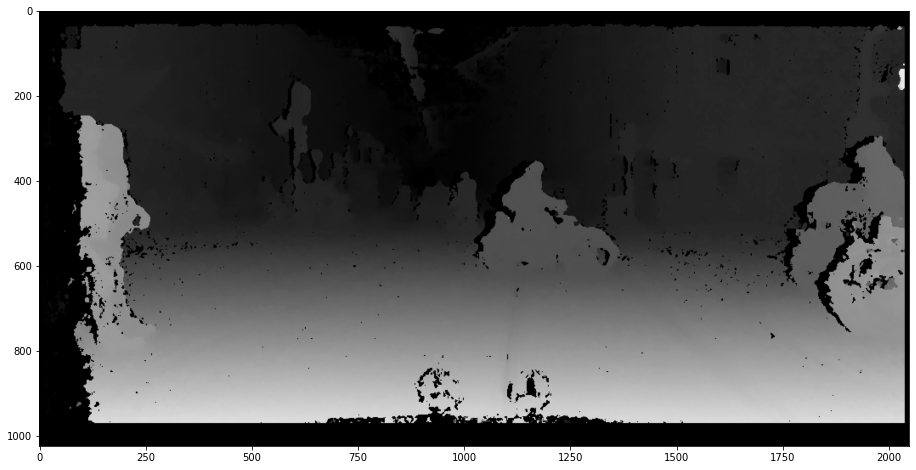

/tmp/ipykernel_415299/2341849433.py:40: RuntimeWarning: divide by zero encountered in true_divide
  depth = baseline*fxy/disparity


Rain layer
Shape = (1024, 2048), max value = 0.3022943384507123, min value = 0.0


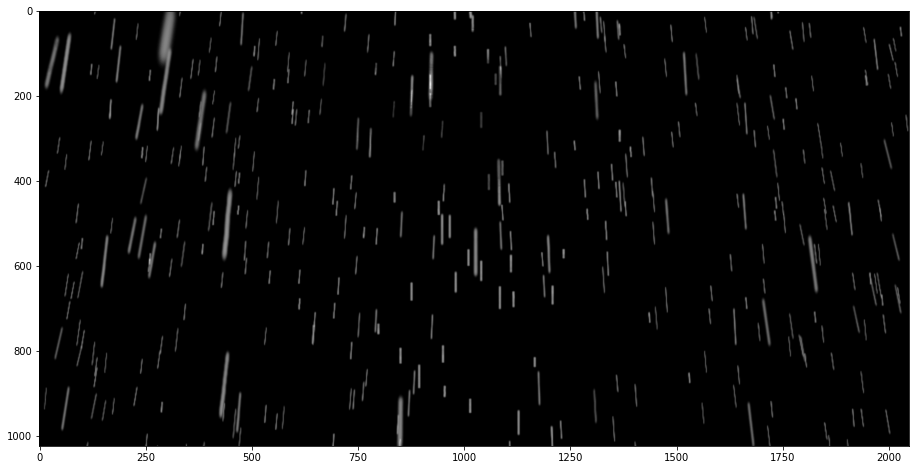

Fog layer
Shape = (1024, 2048), max value = 1.0, min value = 0.0


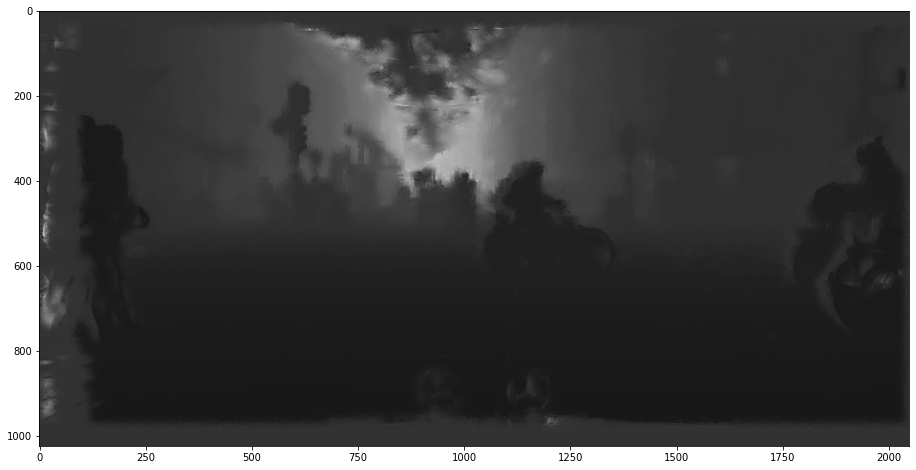

Original
Shape = (1024, 2048, 3), max value = 255, min value = 0


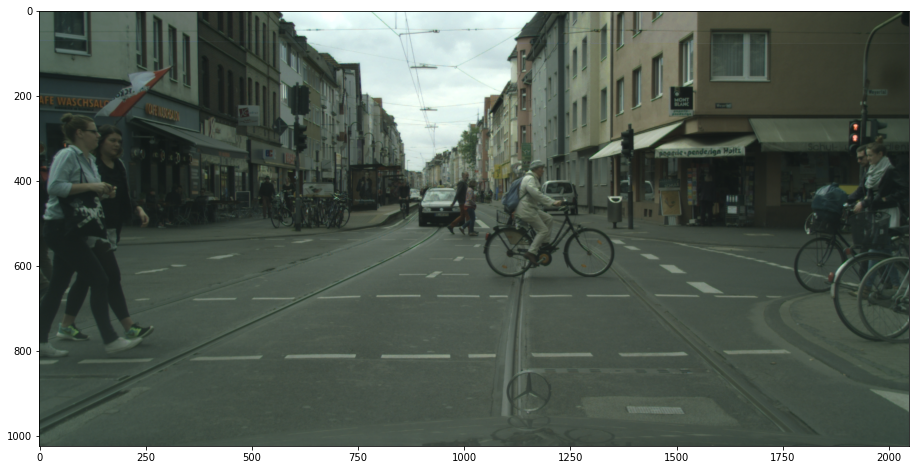

Output
Shape = (1024, 2048, 3), max value = 255, min value = 26


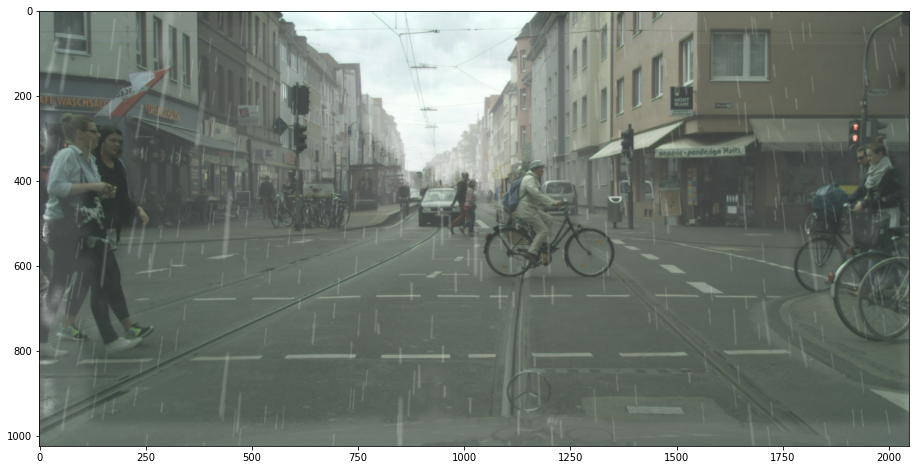

Sample
Shape = (1024, 2048, 3), max value = 255, min value = 11


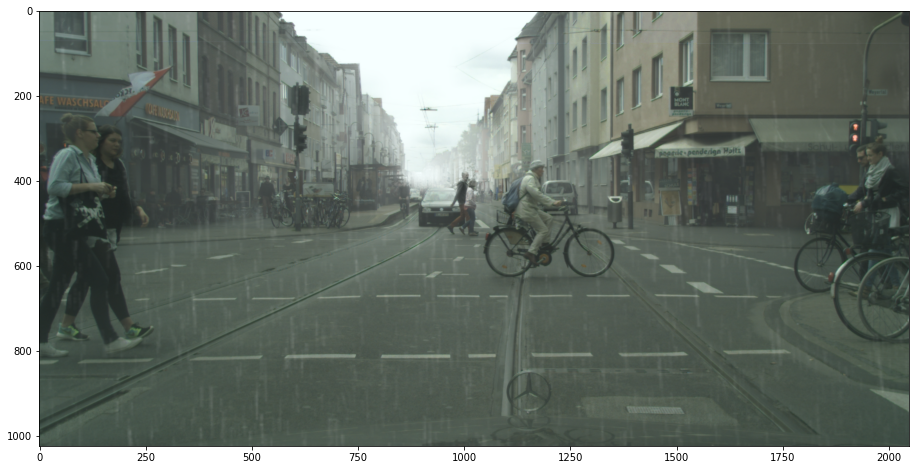

In [4]:
image_name = 'cologne/cologne_000086'
rain_level = '20mm'
rain_pattern = 'cologne_000140'
add_rain(image_name, rain_level, rain_pattern)

Shape = (1024, 2048), max value = 98.53125, min value = 0.0


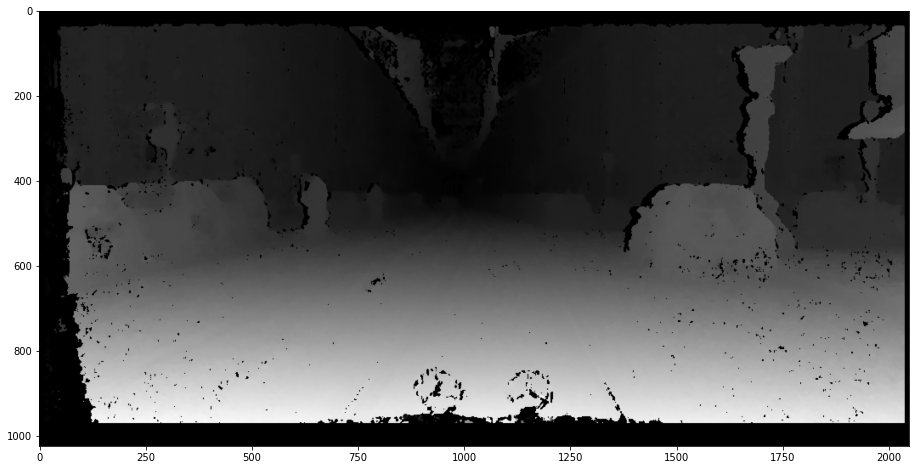

/tmp/ipykernel_415299/2341849433.py:40: RuntimeWarning: divide by zero encountered in true_divide
  depth = baseline*fxy/disparity


Rain layer
Shape = (1024, 2048), max value = 0.3399558177960465, min value = 0.0


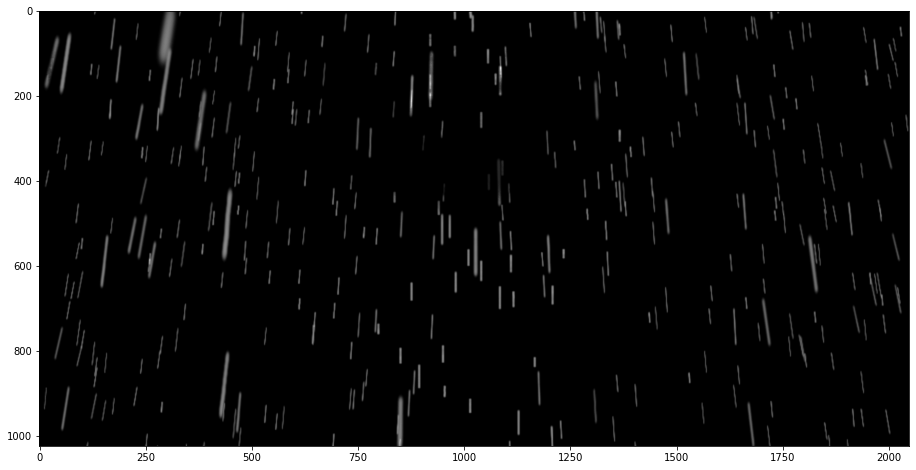

Fog layer
Shape = (1024, 2048), max value = 1.0, min value = 0.0


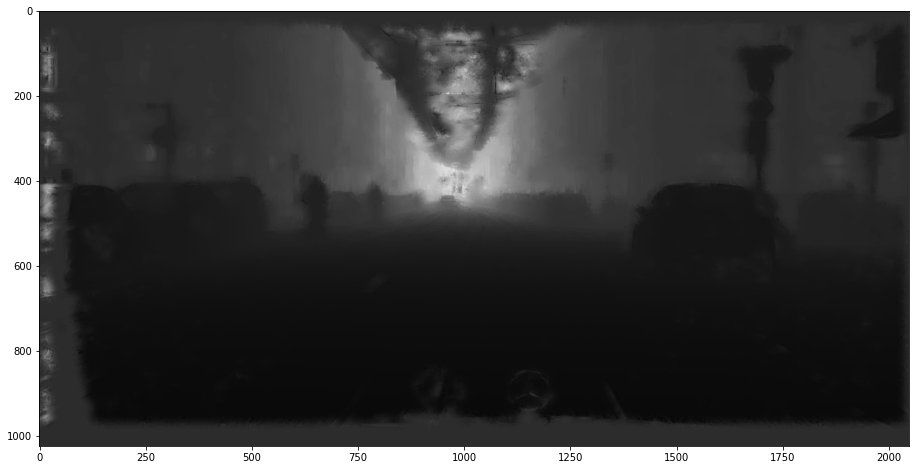

Original
Shape = (1024, 2048, 3), max value = 249, min value = 3


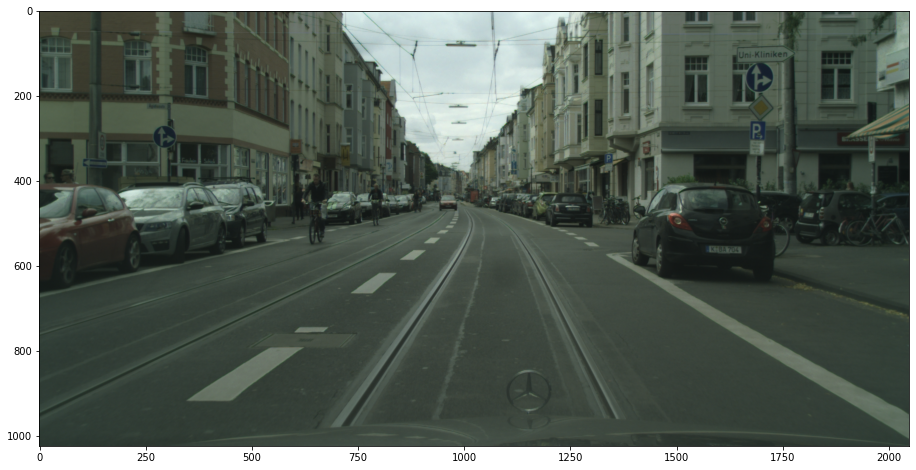

Output
Shape = (1024, 2048, 3), max value = 255, min value = 21


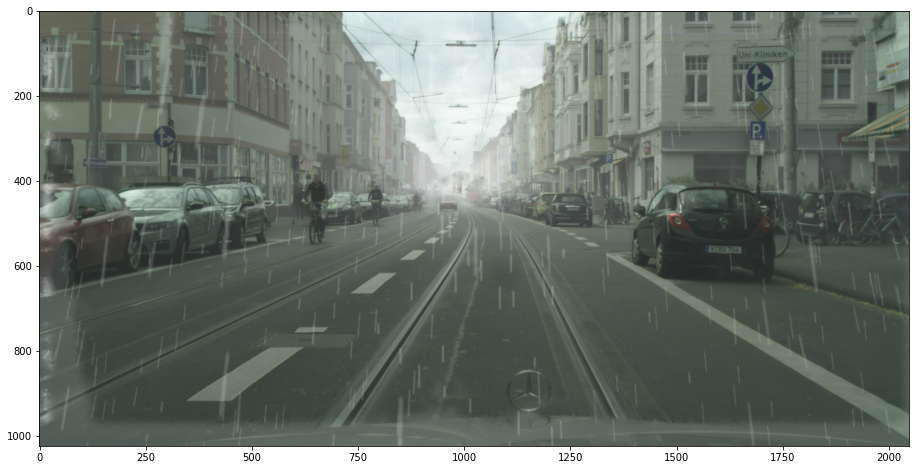

Sample
Shape = (1024, 2048, 3), max value = 244, min value = 19


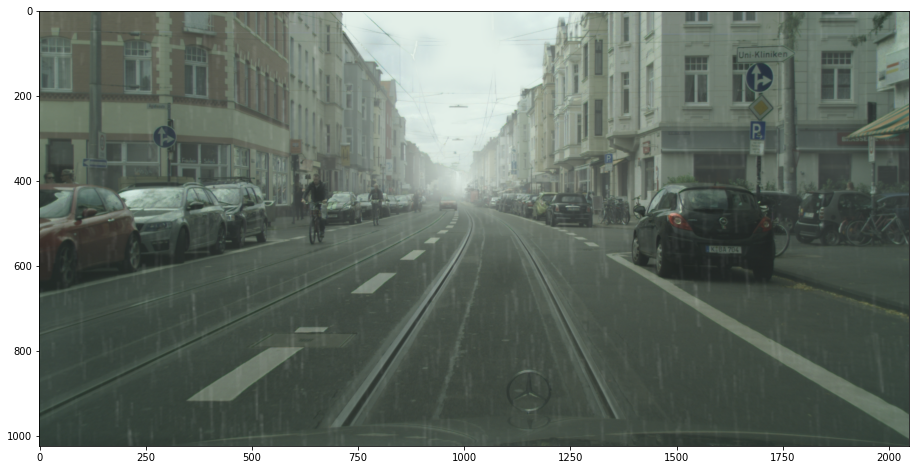

In [5]:
image_name = 'cologne/cologne_000088'
rain_level = '20mm'
rain_pattern = 'cologne_000140'
add_rain(image_name, rain_level, rain_pattern)

Shape = (1024, 2048), max value = 126.0, min value = 0.0


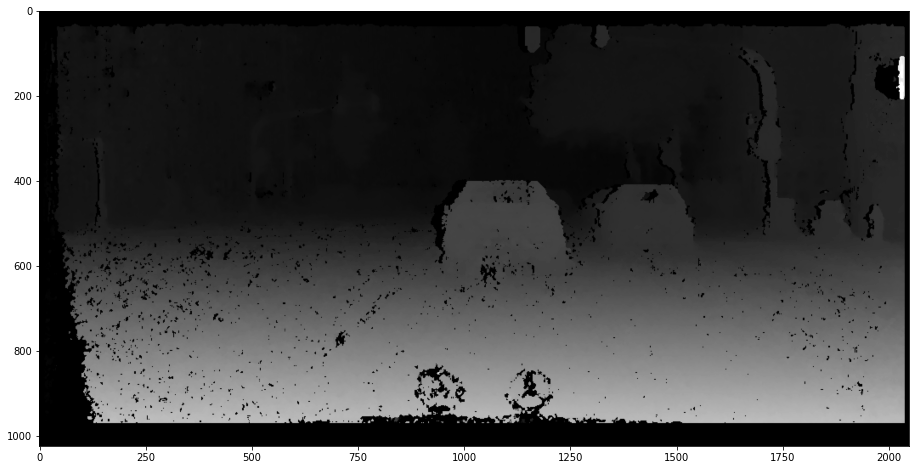

/tmp/ipykernel_415299/2341849433.py:40: RuntimeWarning: divide by zero encountered in true_divide
  depth = baseline*fxy/disparity


Rain layer
Shape = (1024, 2048), max value = 0.27552555838441534, min value = 0.0


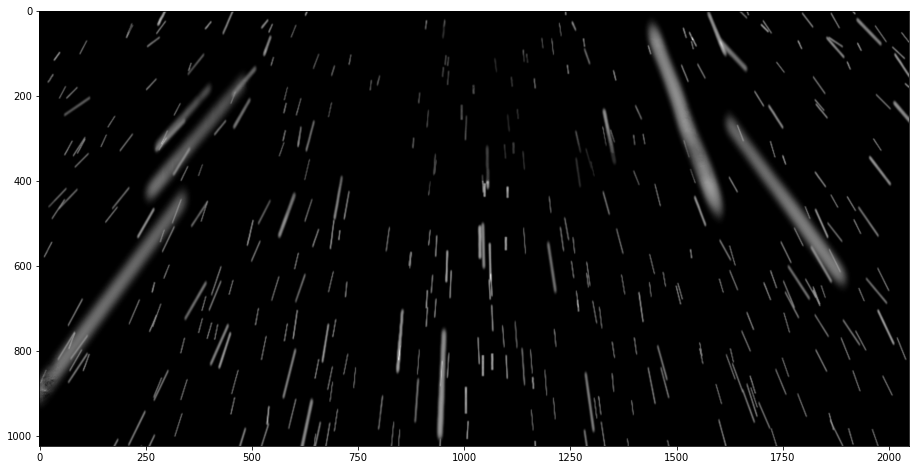

Fog layer
Shape = (1024, 2048), max value = 1.0, min value = 0.0


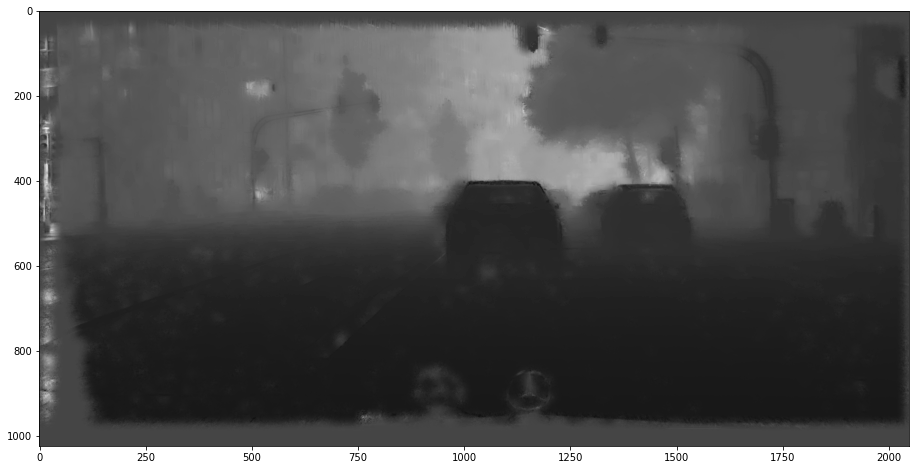

Original
Shape = (1024, 2048, 3), max value = 255, min value = 0


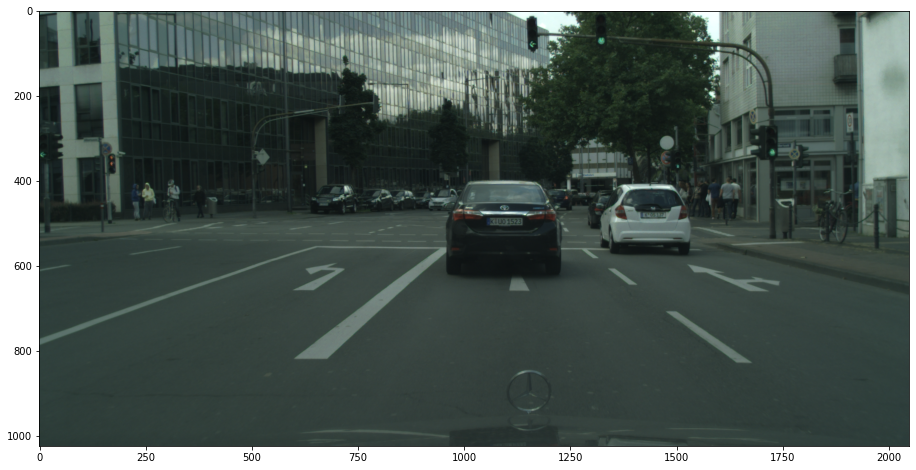

Output
Shape = (1024, 2048, 3), max value = 255, min value = 47


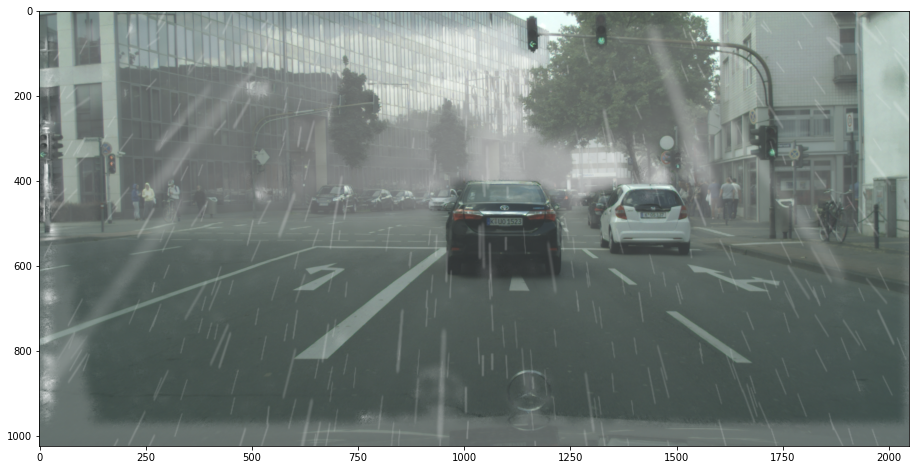

Sample
Shape = (1024, 2048, 3), max value = 255, min value = 16


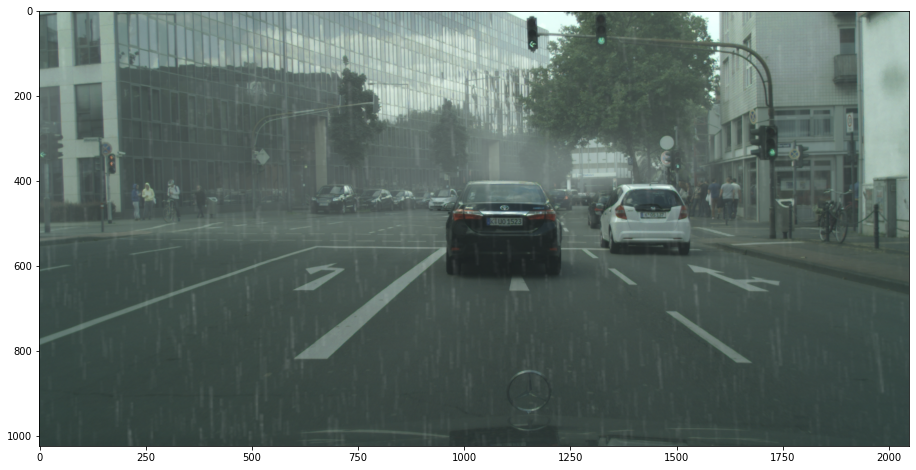

In [6]:
image_name = 'cologne/cologne_000140'
rain_level = '20mm'
rain_pattern = 'cologne_000110'
add_rain(image_name, rain_level, rain_pattern)

Shape = (1024, 2048), max value = 121.37890625, min value = 0.0


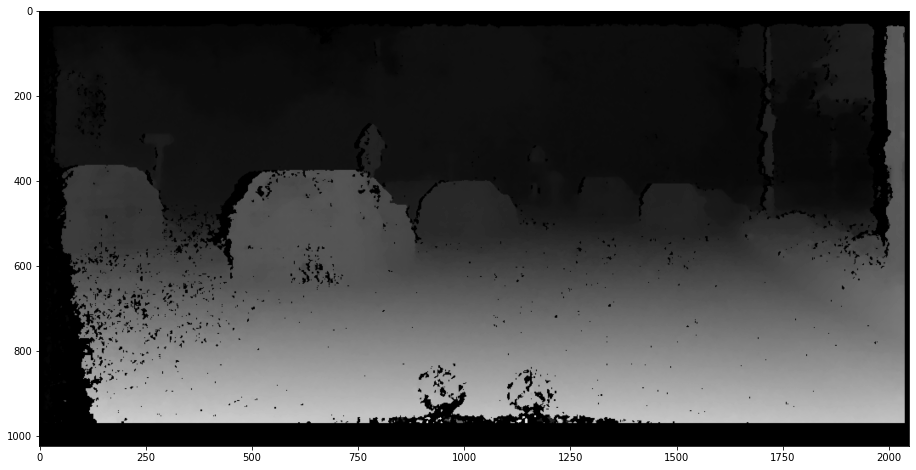

/tmp/ipykernel_415299/2341849433.py:40: RuntimeWarning: divide by zero encountered in true_divide
  depth = baseline*fxy/disparity


Rain layer
Shape = (1024, 2048), max value = 0.36964643297631755, min value = 0.0


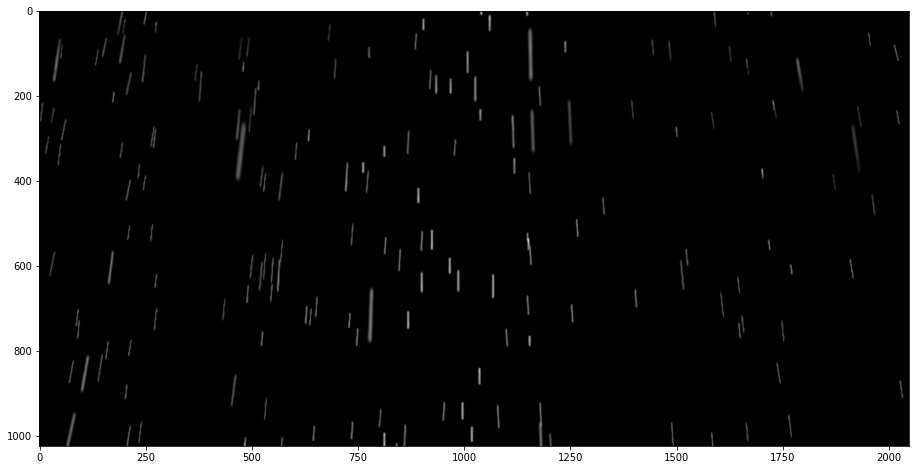

Fog layer
Shape = (1024, 2048), max value = 1.0, min value = 0.0


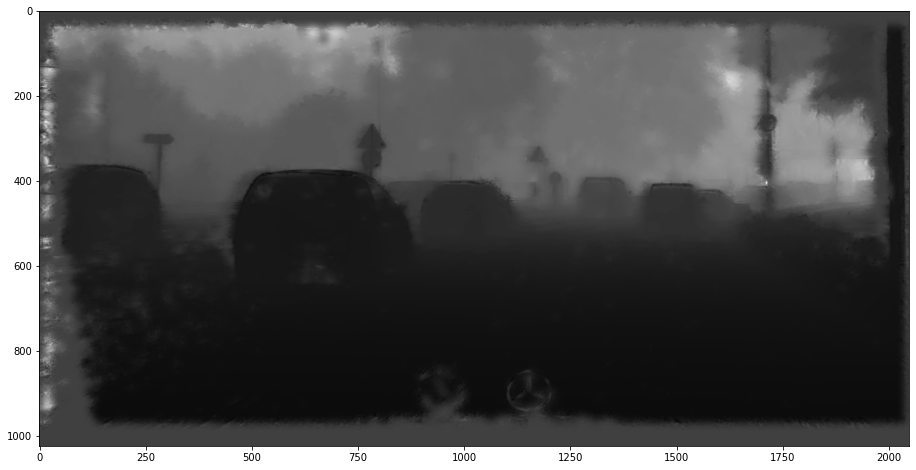

Original
Shape = (1024, 2048, 3), max value = 255, min value = 0


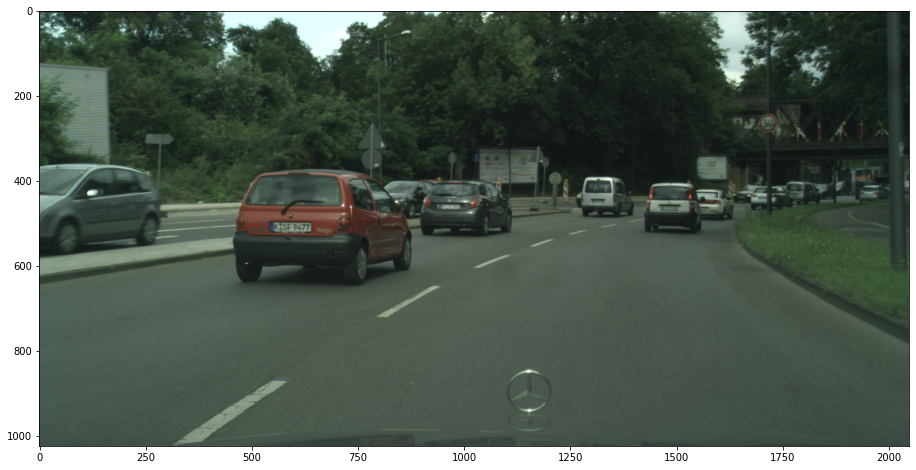

Output
Shape = (1024, 2048, 3), max value = 255, min value = 22


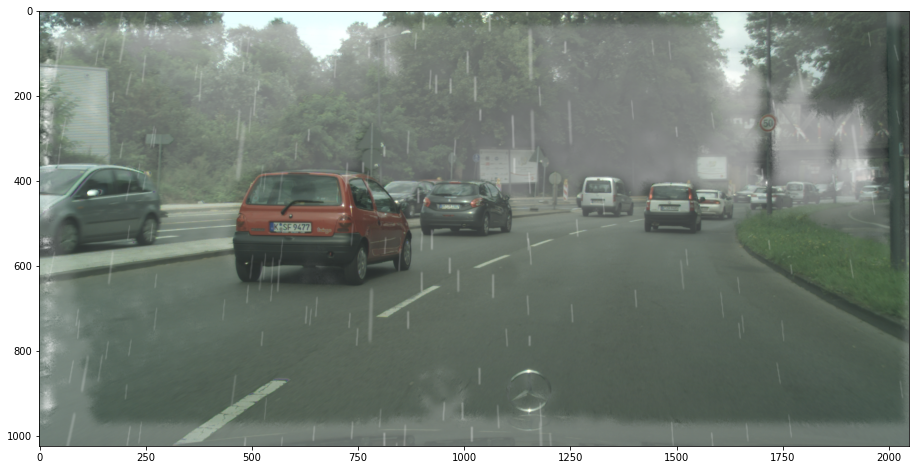

Shape = (1024, 2048), max value = 121.37890625, min value = 0.0


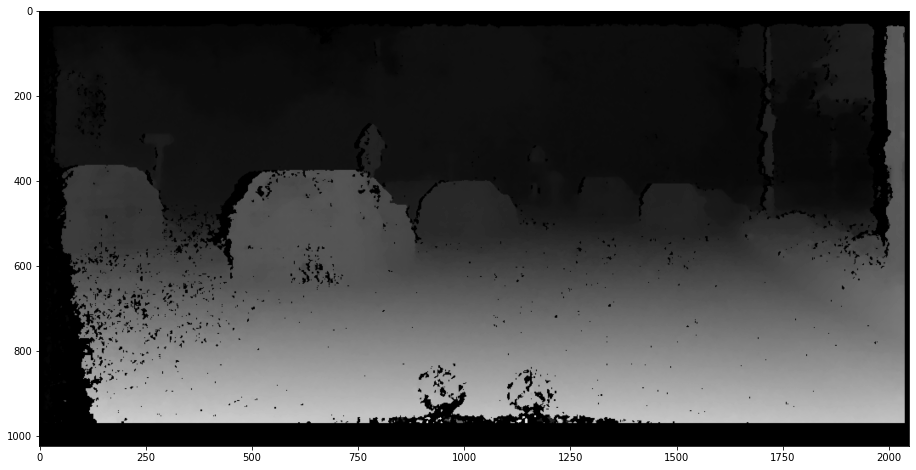

Rain layer
Shape = (1024, 2048), max value = 0.336244693924399, min value = 0.0


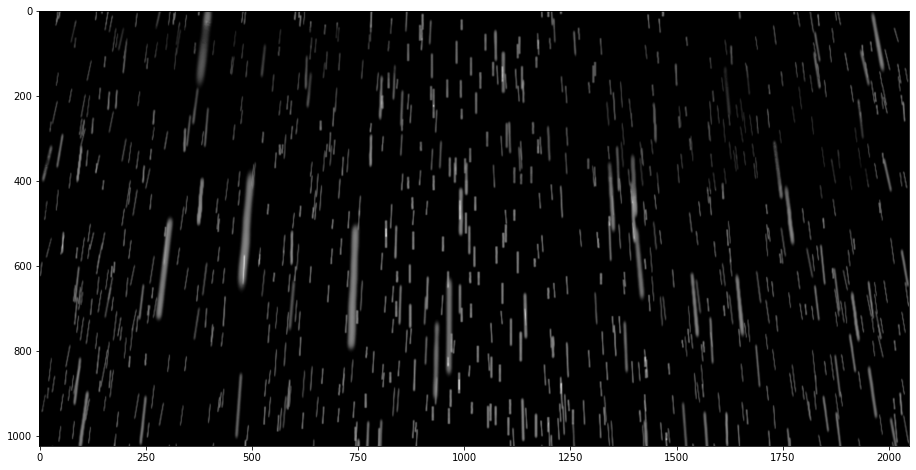

Fog layer
Shape = (1024, 2048), max value = 1.0, min value = 0.0


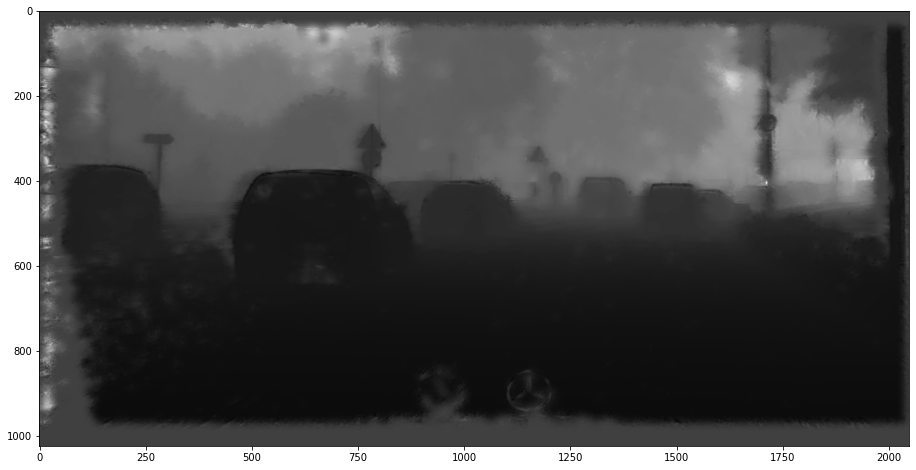

Original
Shape = (1024, 2048, 3), max value = 255, min value = 0


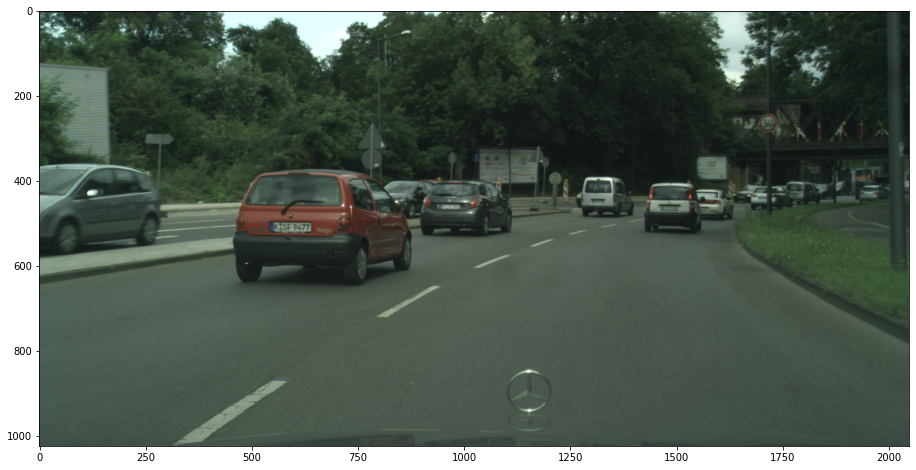

Output
Shape = (1024, 2048, 3), max value = 255, min value = 22


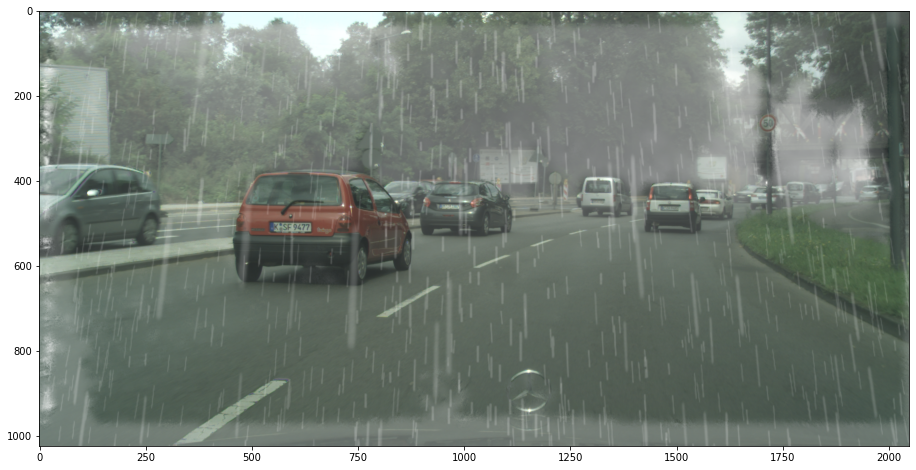

Shape = (1024, 2048), max value = 121.37890625, min value = 0.0


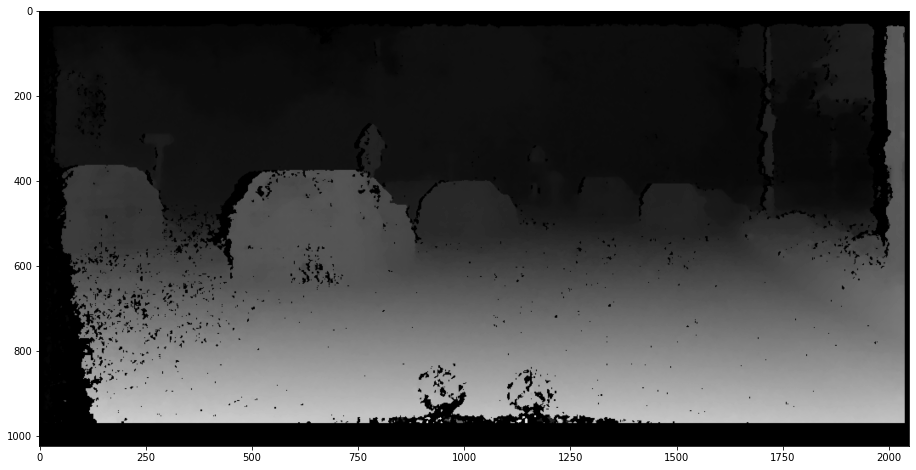

Rain layer
Shape = (1024, 2048), max value = 0.29883154607286644, min value = 0.0


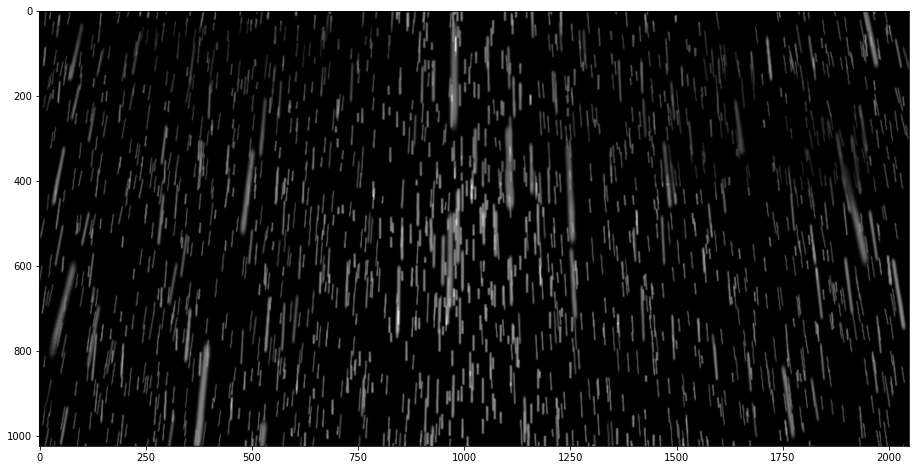

Fog layer
Shape = (1024, 2048), max value = 1.0, min value = 0.0


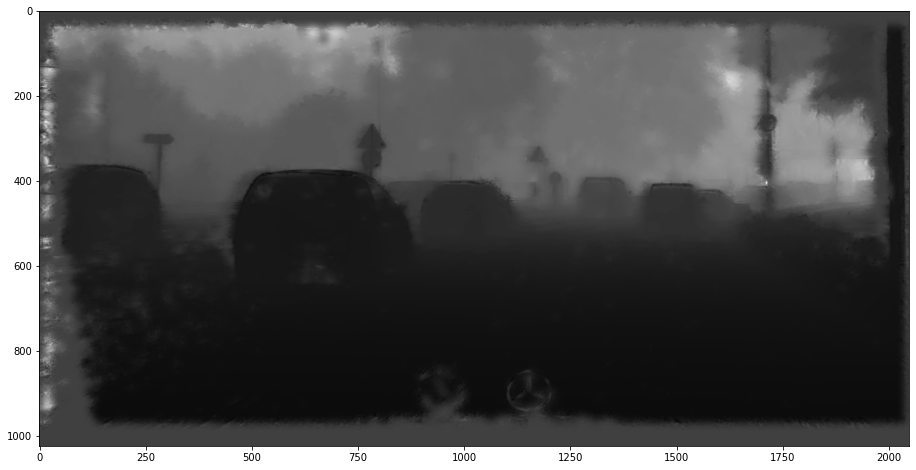

Original
Shape = (1024, 2048, 3), max value = 255, min value = 0


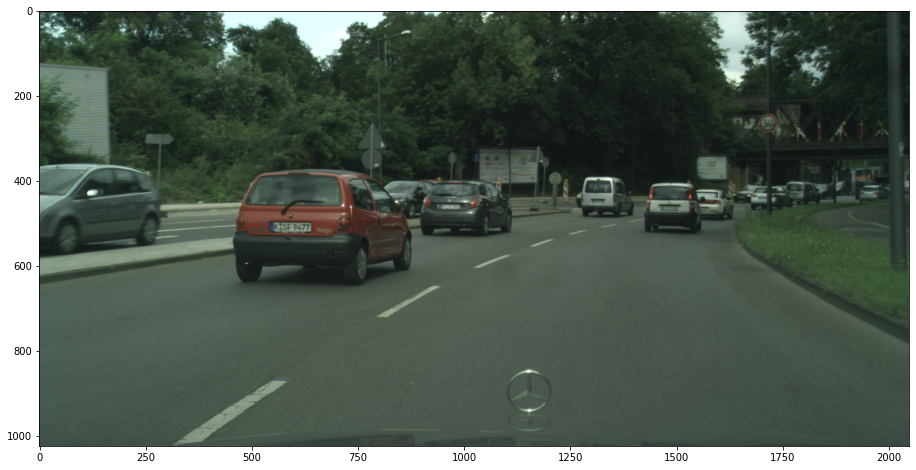

Output
Shape = (1024, 2048, 3), max value = 255, min value = 31


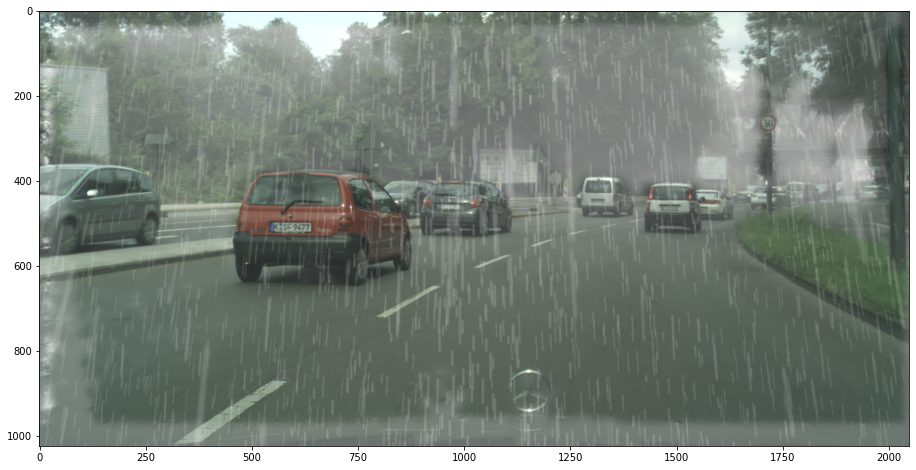

Shape = (1024, 2048), max value = 121.37890625, min value = 0.0


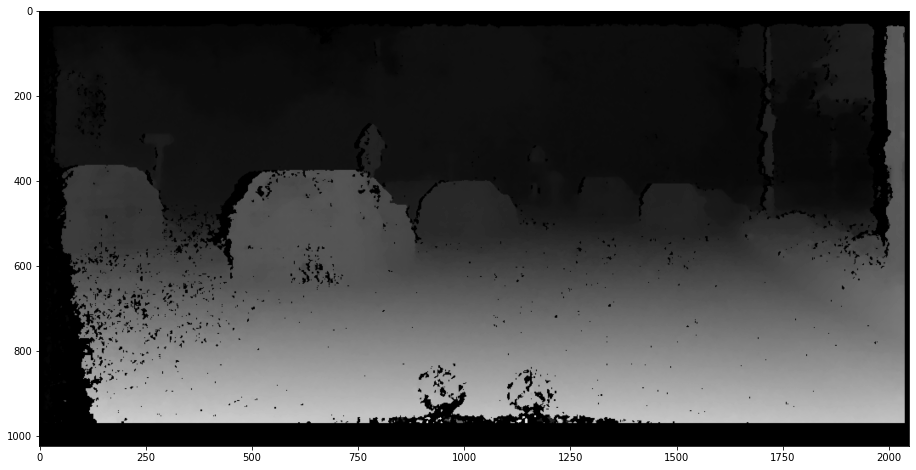

Rain layer
Shape = (1024, 2048), max value = 0.37521339732837056, min value = 0.0


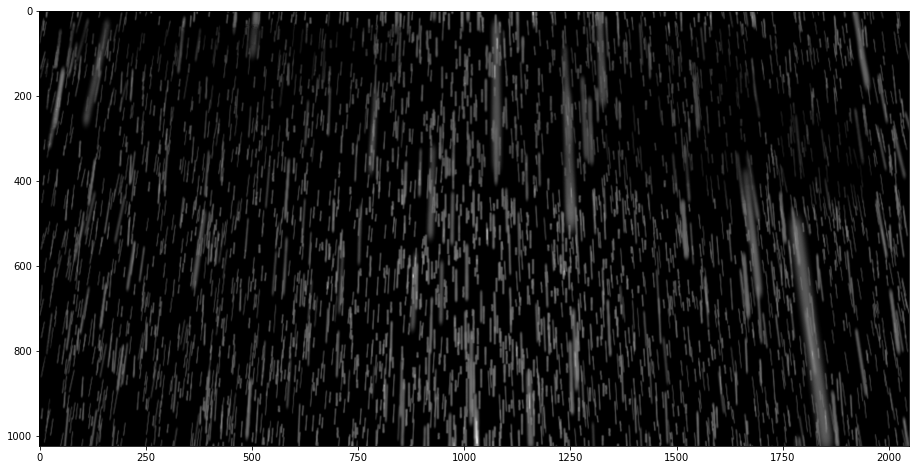

Fog layer
Shape = (1024, 2048), max value = 1.0, min value = 0.0


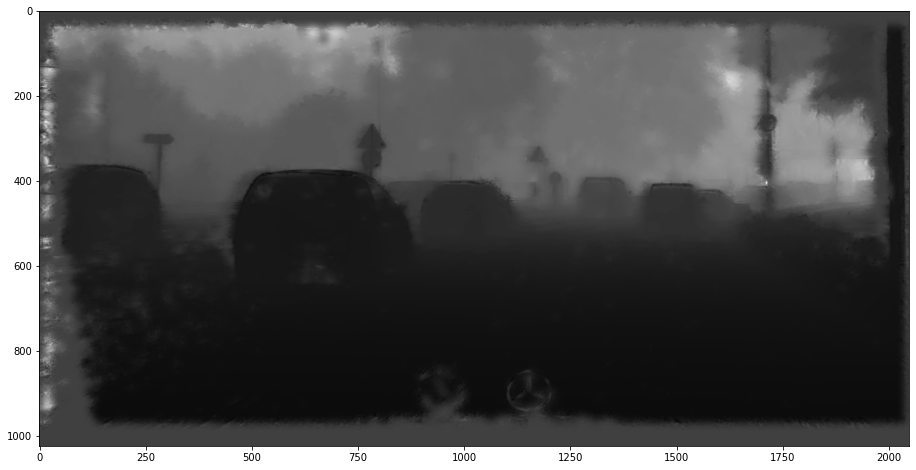

Original
Shape = (1024, 2048, 3), max value = 255, min value = 0


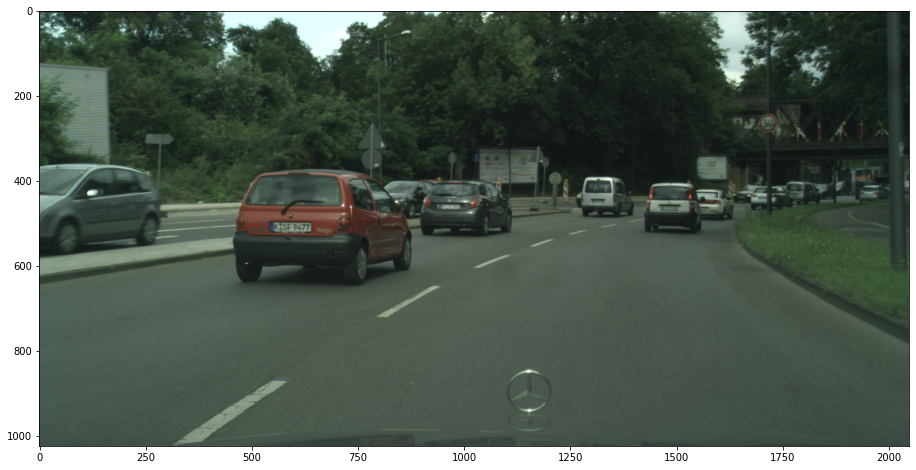

Output
Shape = (1024, 2048, 3), max value = 255, min value = 26


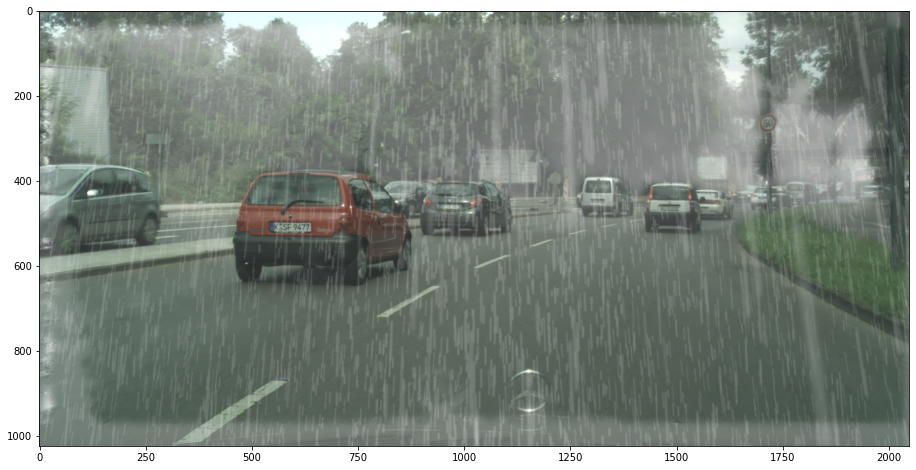

In [7]:
image_name = 'cologne/cologne_000151'
# rain_level = '20mm'
rain_pattern = 'cologne_000140'
for rain_level in ['10mm', '50mm', '100mm', '200mm']:
    add_rain(image_name, rain_level, rain_pattern, sample=False)